In [1]:
import pandas as pd
import sys

pd.set_option("display.max_columns",200)
pd.set_option("display.max_rows",100)
%matplotlib inline

In [2]:
sys.path.insert(1, '../user_lib')
import woe
import completitud as comple
import limpia_texto as clntxt
import atipicos as atp
import estadisticos as estats
import graphixs as graph
import arboles as trees

In [3]:
ar = pd.read_csv("../data/archive_credito/application_record.csv", sep=',', encoding='utf8')
cr = pd.read_csv("../data/archive_credito/credit_record.csv", sep=',', encoding='utf8')

# Calidad de datos
## Proceso de calidad de datos

In [4]:
ar.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


In [5]:
ar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [6]:
cr.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [7]:
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [8]:
cr.STATUS.unique()

array(['X', '0', 'C', '1', '2', '3', '4', '5'], dtype=object)

Reinterpretamos los valores de la variable objetivo en una clasificación binaria
C, X, 0 y 1 son para un buen deudor, por lo que su bandera será 1
2, 3, 4, y 5 son para malos deudores, por lo que su bandera será 0

In [9]:
status_transform = {
    'C': 'GOOD',
    'X': 'GOOD',
    '0': 'GOOD',
    '1': 'GOOD',
    '2': 'BAD',
    '3': 'BAD',
    '4': 'BAD',
    '5': 'BAD' }

In [10]:
cr.replace({'STATUS': status_transform}, inplace=True)

In [11]:
cr.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,GOOD
1,5001711,-1,GOOD
2,5001711,-2,GOOD
3,5001711,-3,GOOD
4,5001712,0,GOOD


In [12]:
cr.groupby('ID').aggregate(sum)

,MONTHS_BALANCE
ID,
5001711,-6
5001712,-171
5001713,-231
5001714,-105
5001715,-1770
...,...
5150482,-351
5150483,-153
5150484,-78


In [13]:
cr['STATUS'].value_counts()

GOOD    1045471
BAD        3104
Name: STATUS, dtype: int64

Agrupar los estados por ID y valores del STATUS

In [14]:
cr = cr.value_counts(subset=['ID', 'STATUS']).unstack(fill_value=0)

In [15]:
cr

STATUS,BAD,GOOD
ID,,
5001711,0,4
5001712,0,19
5001713,0,22
5001714,0,15
5001715,0,60
...,...,...
5150482,0,18
5150483,0,18
5150484,0,13


Definimos una variable objetivo

In [16]:
cr.loc[(cr['GOOD'] > 24), 'tgt'] = 1 #Si los meses buenos superan los 24 meses se aprueba el crédito
cr.loc[(cr['GOOD'] <= 24), 'tgt'] = 0 #Si los meses malosson inferiores a 24, no se aprueba el crédito

In [17]:
cr

STATUS,BAD,GOOD,tgt
ID,,,
5001711,0,4,0.0
5001712,0,19,0.0
5001713,0,22,0.0
5001714,0,15,0.0
5001715,0,60,1.0
...,...,...,...
5150482,0,18,0.0
5150483,0,18,0.0
5150484,0,13,0.0


In [18]:
cr['tgt'].value_counts(1)

0.0    0.603523
1.0    0.396477
Name: tgt, dtype: float64

In [19]:
cr['tgt'].value_counts()

0.0    27753
1.0    18232
Name: tgt, dtype: int64

In [20]:
### Cruce de tabals por ID

In [21]:
df = ar.reset_index().merge(cr, on='ID').set_index('index')
df

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,BAD,GOOD,tgt
index,,,,,,,,,,,,,,,,,,,,,
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,16,0.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,15,0.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,0,30,1.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0,5,0.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0,5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434808,5149828,M,Y,Y,0,315000.0,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,1,0,0,0,Managers,2.0,4,8,0.0
434809,5149834,F,N,Y,0,157500.0,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,11,13,0.0
434810,5149838,F,N,Y,0,157500.0,Pensioner,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,11,22,0.0


### Etiquetado de variables

In [22]:
names = list(df.columns)
names

['ID',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'FLAG_MOBIL',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'BAD',
 'GOOD',
 'tgt']

In [23]:
vars_c = ['CNT_CHILDREN',
          'AMT_INCOME_TOTAL',
          'DAYS_BIRTH',
          'DAYS_EMPLOYED',
          'CNT_FAM_MEMBERS',
          'BAD',
          'GOOD']

vars_v = ['CODE_GENDER',
          'FLAG_OWN_CAR',
          'FLAG_OWN_REALTY',
          'FLAG_MOBIL',
          'FLAG_WORK_PHONE',
          'FLAG_PHONE',
          'FLAG_EMAIL',
          'OCCUPATION_TYPE',
          'NAME_INCOME_TYPE',
          'NAME_EDUCATION_TYPE',
          'NAME_FAMILY_STATUS',
          'NAME_HOUSING_TYPE',
          'OCCUPATION_TYPE']
len(vars_v) + len(vars_c)

20

In [24]:
len(names)

21

In [25]:
df.rename(columns=dict(zip(vars_v, ('v_' + i.lower() for i in vars_v))), inplace=True)
df.rename(columns=dict(zip(vars_c, ('c_' + i.lower() for i in vars_c))), inplace=True)

In [26]:
df.head(10)

,ID,v_code_gender,v_flag_own_car,v_flag_own_realty,c_cnt_children,c_amt_income_total,v_name_income_type,v_name_education_type,v_name_family_status,v_name_housing_type,c_days_birth,c_days_employed,v_flag_mobil,v_flag_work_phone,v_flag_phone,v_flag_email,v_occupation_type,c_cnt_fam_members,c_bad,c_good,tgt
index,,,,,,,,,,,,,,,,,,,,,
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,16,0.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,15,0.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,0,30,1.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0,5,0.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0,5,0.0
5,5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0,27,1.0
6,5008811,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0,39,1.0
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,0,17,0.0
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,0,17,0.0


In [27]:
# Liberar la memoria ocupada por los datasets que se mezclaron anteriormente para no comprometer el rendimiento de la computadora
del(cr)
del(ar)

In [28]:
#Obtenemos información básica del DataFrame final
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 434812
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     36457 non-null  int64  
 1   v_code_gender          36457 non-null  object 
 2   v_flag_own_car         36457 non-null  object 
 3   v_flag_own_realty      36457 non-null  object 
 4   c_cnt_children         36457 non-null  int64  
 5   c_amt_income_total     36457 non-null  float64
 6   v_name_income_type     36457 non-null  object 
 7   v_name_education_type  36457 non-null  object 
 8   v_name_family_status   36457 non-null  object 
 9   v_name_housing_type    36457 non-null  object 
 10  c_days_birth           36457 non-null  int64  
 11  c_days_employed        36457 non-null  int64  
 12  v_flag_mobil           36457 non-null  int64  
 13  v_flag_work_phone      36457 non-null  int64  
 14  v_flag_phone           36457 non-null  int64  
 15  v

### Revisión de duplicados

In [29]:
df.duplicated(subset='ID').sum()

0

In [30]:
df.duplicated().sum()

0

### Completitud

In [31]:
import missingno as msno
from matplotlib import pyplot as plt

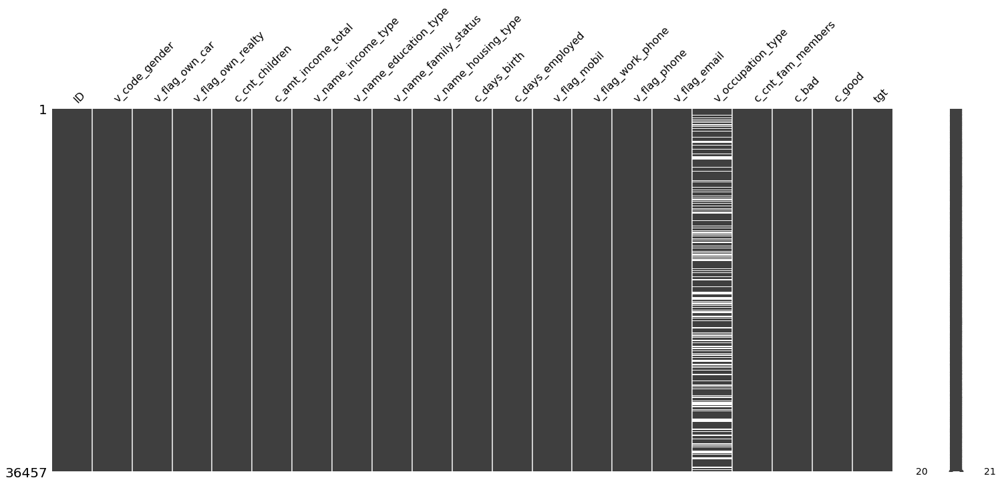

In [32]:
msno.matrix(df)
plt.show()

In [33]:
comple.completitud(df)

,columna,total faltantes,completitud
16,v_occupation_type,11323,68.941493
0,ID,0,100.000000
18,c_bad,0,100.000000
17,c_cnt_fam_members,0,100.000000
15,v_flag_email,0,100.000000
14,v_flag_phone,0,100.000000
13,v_flag_work_phone,0,100.000000
12,v_flag_mobil,0,100.000000
11,c_days_employed,0,100.000000
19,c_good,0,100.000000


La variable de v_occupation_type no cumple con el 80% de completitud, sim embargo, por tratarse de un problema de claificación binaria, es conveniente conservarla imputando los valores de esa varable con alguna categoría nueva

In [34]:
df['v_occupation_type'].value_counts()

Laborers                 6211
Core staff               3591
Sales staff              3485
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: v_occupation_type, dtype: int64

In [35]:
df[df['v_occupation_type'].isnull()]

,ID,v_code_gender,v_flag_own_car,v_flag_own_realty,c_cnt_children,c_amt_income_total,v_name_income_type,v_name_education_type,v_name_family_status,v_name_housing_type,c_days_birth,c_days_employed,v_flag_mobil,v_flag_work_phone,v_flag_phone,v_flag_email,v_occupation_type,c_cnt_fam_members,c_bad,c_good,tgt
index,,,,,,,,,,,,,,,,,,,,,
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,16,0.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,15,0.0
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,0,17,0.0
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,0,17,0.0
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,0,17,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434795,5148602,M,N,Y,0,225000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-22946,365243,1,0,0,0,NaN,2.0,2,14,0.0
434796,5148679,F,N,N,0,121500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-18828,-6195,1,0,0,0,NaN,2.0,1,23,0.0
434801,5149055,F,N,Y,0,112500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-15837,-2694,1,1,1,0,NaN,2.0,2,18,0.0


In [36]:
df['v_occupation_type'].fillna(value='Other', inplace=True)

Identificando variables unarias

In [37]:
names = list(df.filter(like='v_flag'))

In [38]:
df[names].value_counts()

v_flag_own_car  v_flag_own_realty  v_flag_mobil  v_flag_work_phone  v_flag_phone  v_flag_email
N               Y                  1             0                  0             0               9138
Y               Y                  1             0                  0             0               5486
N               N                  1             0                  0             0               3402
                Y                  1             0                  1             0               2394
Y               N                  1             0                  0             0               2018
N               Y                  1             1                  1             0               1555
Y               Y                  1             0                  1             0               1304
N               N                  1             1                  0             0               1181
                                                 0                  1            

La variable v_flag_mobil es unaria, se quita del DataFrame

In [39]:
df.drop('v_flag_mobil', axis=1, inplace=True)

Casteaos las variables numéricas a tipo entero o flotante según sea el caso

In [40]:
df.filter(like='c_')

,c_cnt_children,c_amt_income_total,c_days_birth,c_days_employed,c_cnt_fam_members,c_bad,c_good
index,,,,,,,
0,0,427500.0,-12005,-4542,2.0,0,16
1,0,427500.0,-12005,-4542,2.0,0,15
2,0,112500.0,-21474,-1134,2.0,0,30
3,0,270000.0,-19110,-3051,1.0,0,5
4,0,270000.0,-19110,-3051,1.0,0,5
...,...,...,...,...,...,...,...
434808,0,315000.0,-17348,-2420,2.0,4,8
434809,0,157500.0,-12387,-1325,2.0,11,13
434810,0,157500.0,-12387,-1325,2.0,11,22


In [41]:
df[['c_amt_income_total', 'c_cnt_fam_members']] = df[['c_amt_income_total', 'c_cnt_fam_members']] .astype(int)

In [42]:
df.tgt = df.tgt.astype(int)

In [43]:
df.head()

,ID,v_code_gender,v_flag_own_car,v_flag_own_realty,c_cnt_children,c_amt_income_total,v_name_income_type,v_name_education_type,v_name_family_status,v_name_housing_type,c_days_birth,c_days_employed,v_flag_work_phone,v_flag_phone,v_flag_email,v_occupation_type,c_cnt_fam_members,c_bad,c_good,tgt
index,,,,,,,,,,,,,,,,,,,,
0,5008804,M,Y,Y,0,427500,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,0,Other,2,0,16,0
1,5008805,M,Y,Y,0,427500,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,0,Other,2,0,15,0
2,5008806,M,Y,Y,0,112500,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,0,0,0,Security staff,2,0,30,1
3,5008808,F,N,Y,0,270000,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,1,Sales staff,1,0,5,0
4,5008809,F,N,Y,0,270000,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,1,Sales staff,1,0,5,0


Las variables bad y good creadas para la obtención de la variable objetivo tinen multicolinealidad alta por definición con le objetivo, por lo tanto se quitan en este paso de calidad de datos. En este caso se determinó así por deducción lógica, no fue necesario ejecutar alguna prueba estadística.

In [44]:
df.drop(['c_bad', 'c_good'], axis=1, inplace=True)

In [45]:
df.v_code_gender.value_counts()

F    24430
M    12027
Name: v_code_gender, dtype: int64

In [46]:
df.v_flag_own_car.value_counts()

N    22614
Y    13843
Name: v_flag_own_car, dtype: int64

In [47]:
comple.completitud(df)

,columna,total faltantes,completitud
0,ID,0,100.0
15,v_occupation_type,0,100.0
14,v_flag_email,0,100.0
13,v_flag_phone,0,100.0
12,v_flag_work_phone,0,100.0
11,c_days_employed,0,100.0
10,c_days_birth,0,100.0
9,v_name_housing_type,0,100.0
8,v_name_family_status,0,100.0
7,v_name_education_type,0,100.0


# Análisis exploratorio

In [48]:
import seaborn as sns
import plotly.express as px

In [49]:
df.head()

,ID,v_code_gender,v_flag_own_car,v_flag_own_realty,c_cnt_children,c_amt_income_total,v_name_income_type,v_name_education_type,v_name_family_status,v_name_housing_type,c_days_birth,c_days_employed,v_flag_work_phone,v_flag_phone,v_flag_email,v_occupation_type,c_cnt_fam_members,tgt
index,,,,,,,,,,,,,,,,,,
0,5008804,M,Y,Y,0,427500,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,0,Other,2,0
1,5008805,M,Y,Y,0,427500,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,0,Other,2,0
2,5008806,M,Y,Y,0,112500,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,0,0,0,Security staff,2,1
3,5008808,F,N,Y,0,270000,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,1,Sales staff,1,0
4,5008809,F,N,Y,0,270000,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,1,Sales staff,1,0


/home/sqpr14_/anaconda3/envs/dss/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='c_cnt_children', ylabel='Density'>

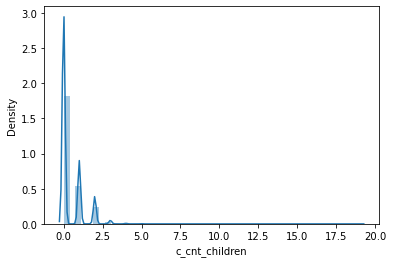

In [50]:
sns.distplot(df['c_cnt_children'])

/home/sqpr14_/anaconda3/envs/dss/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='c_cnt_fam_members', ylabel='Density'>

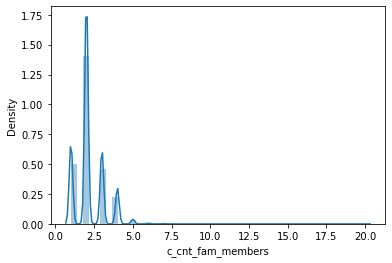

In [51]:
sns.distplot(df['c_cnt_fam_members'])

/home/sqpr14_/anaconda3/envs/dss/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='c_amt_income_total', ylabel='Density'>

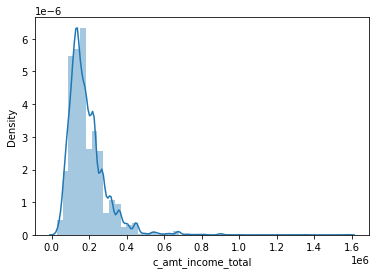

In [52]:
sns.distplot(df['c_amt_income_total'])

In [53]:
f = px.scatter(df, x='c_amt_income_total', y='c_cnt_fam_members', color='v_code_gender')
f.show()

In [54]:
for col in df.filter(like="v_"):
    graph.bar(df,col,col).show()

Se observa una gran tendencia a la categoría Otros en la ocupación
¿Cuál es la relación entre la ocupación y las días trabajadas?

array([[<AxesSubplot:title={'center':'Accountants'}>,
        <AxesSubplot:title={'center':'Cleaning staff'}>,
        <AxesSubplot:title={'center':'Cooking staff'}>,
        <AxesSubplot:title={'center':'Core staff'}>],
       [<AxesSubplot:title={'center':'Drivers'}>,
        <AxesSubplot:title={'center':'HR staff'}>,
        <AxesSubplot:title={'center':'High skill tech staff'}>,
        <AxesSubplot:title={'center':'IT staff'}>],
       [<AxesSubplot:title={'center':'Laborers'}>,
        <AxesSubplot:title={'center':'Low-skill Laborers'}>,
        <AxesSubplot:title={'center':'Managers'}>,
        <AxesSubplot:title={'center':'Medicine staff'}>],
       [<AxesSubplot:title={'center':'Other'}>,
        <AxesSubplot:title={'center':'Private service staff'}>,
        <AxesSubplot:title={'center':'Realty agents'}>,
        <AxesSubplot:title={'center':'Sales staff'}>],
       [<AxesSubplot:title={'center':'Secretaries'}>,
        <AxesSubplot:title={'center':'Security staff'}>,
       

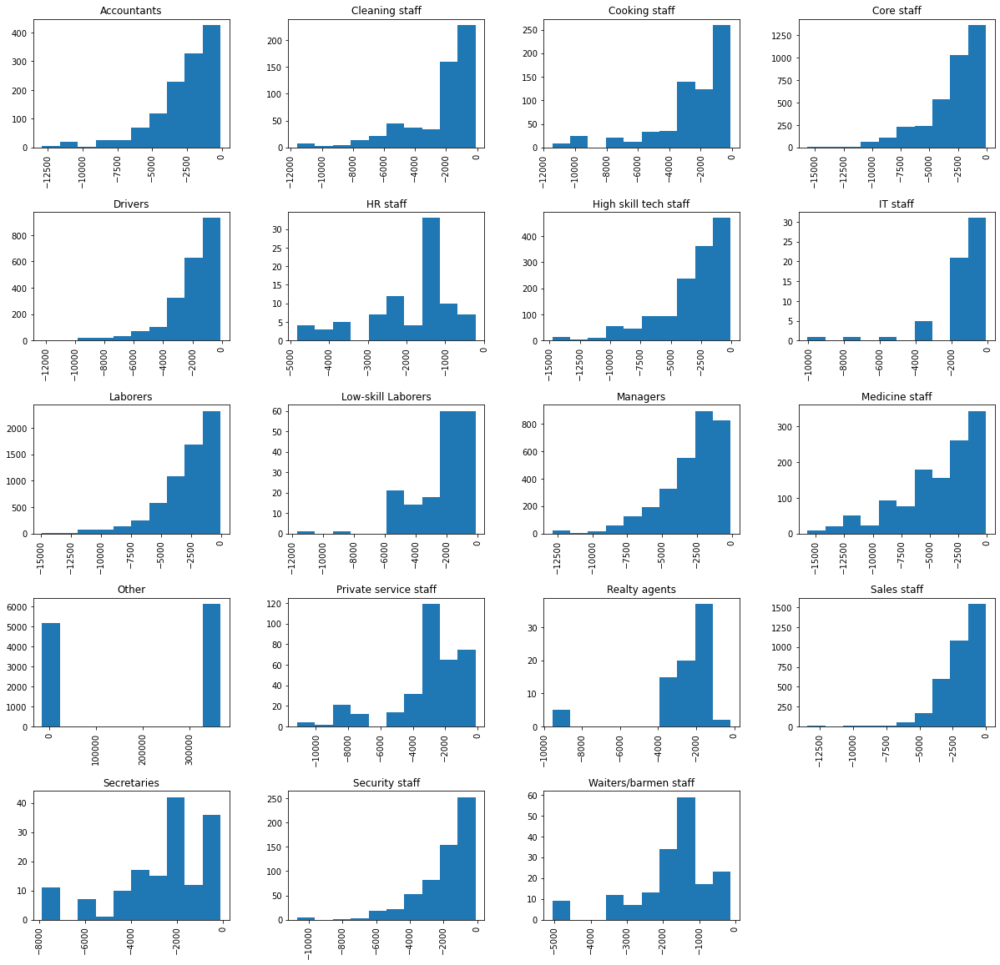

In [55]:
pd.options.plotting.backend = "matplotlib"
df[['c_days_employed','v_occupation_type']].hist(by='v_occupation_type', figsize=(20, 20))

Las gráficas anteriores nos muestran que parece haber un problema relacionado entre la categoría Other y el número de días trabajados

In [56]:
df[df['v_occupation_type'] == 'Other'].shape[0]

11323

In [57]:
df.shape[0]

36457

In [58]:
df[df['v_occupation_type'] == 'Other'].shape[0]/36457

0.3105850728255205

Es el 31% de la información, no se puede quitar, hay que encontrar una manera de solucionar la situación...m

array([[<AxesSubplot:title={'center':'Accountants'}>,
        <AxesSubplot:title={'center':'Core staff'}>,
        <AxesSubplot:title={'center':'Drivers'}>],
       [<AxesSubplot:title={'center':'Laborers'}>,
        <AxesSubplot:title={'center':'Low-skill Laborers'}>,
        <AxesSubplot:title={'center':'Managers'}>],
       [<AxesSubplot:title={'center':'Medicine staff'}>,
        <AxesSubplot:title={'center':'Other'}>, <AxesSubplot:>]],
      dtype=object)

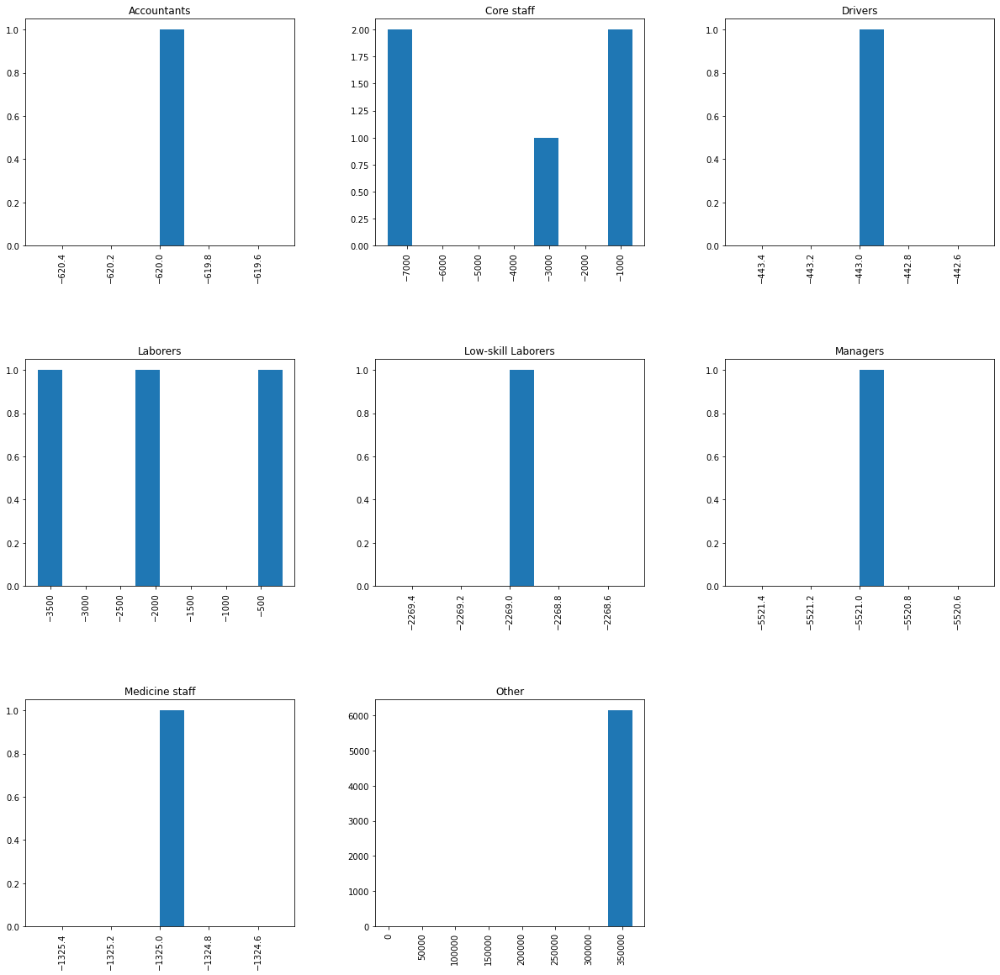

In [59]:
df.loc[df['v_name_income_type'] == 'Pensioner'][['c_days_employed','v_occupation_type']].hist(by='v_occupation_type', figsize=(20, 20))

La mayoría de los pensionados tienen como ocupación la categoría Otros

In [60]:
df.loc[(df['c_days_employed'] > 0), 'c_days_employed'] = 0

In [61]:
df.loc[(df['v_name_income_type'] == 'Pensioner') & (df['v_occupation_type'] == 'Other'), 'v_occupation_type'] = 'Pensioner'

In [62]:
df.head()

,ID,v_code_gender,v_flag_own_car,v_flag_own_realty,c_cnt_children,c_amt_income_total,v_name_income_type,v_name_education_type,v_name_family_status,v_name_housing_type,c_days_birth,c_days_employed,v_flag_work_phone,v_flag_phone,v_flag_email,v_occupation_type,c_cnt_fam_members,tgt
index,,,,,,,,,,,,,,,,,,
0,5008804,M,Y,Y,0,427500,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,0,Other,2,0
1,5008805,M,Y,Y,0,427500,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,0,Other,2,0
2,5008806,M,Y,Y,0,112500,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,0,0,0,Security staff,2,1
3,5008808,F,N,Y,0,270000,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,1,Sales staff,1,0
4,5008809,F,N,Y,0,270000,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,1,Sales staff,1,0


Con esto se reduce consoderablemente el número de Otros en la variable ocupación, pqara esto, pasamos por hecho de que los pensionados ya trabajaron, pero ahora mismo no lo hacen y espor ello que pasaron los día trabajados a cero

In [63]:
df['v_occupation_type'].value_counts()

Laborers                 6211
Pensioner                6139
Other                    5184
Core staff               3591
Sales staff              3485
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: v_occupation_type, dtype: int64

In [64]:
5184/df.shape[0]

0.14219491455687522

Sigue siendo el 14% del total, no se puede eliminar, pero se redujo bastante

In [65]:
#Desechamos la variable ID que ya no nos sirve de nada
df.drop(['ID'], axis=1, inplace=True)

## Revisión de datos anómalos

In [66]:
for c in df.filter(like='c_'):
    graph.box(df, c, c).show()

In [67]:
for c in df.filter(like='c_'):
    graph.histogram(df, c, 10, c).show()

Prácticamente todas las variables de tipo numérico tienen datos atípicos... procedemos a limpiarlas

In [68]:

import numpy as np

def OUTLIERS(df,cols):
    results=pd.DataFrame()
    data_iqr=df.copy()
    data_per=df.copy()
    total=[]
    total_per=[]
    total_z=[]
    indices_=[]

    for col in cols:
        #IQR
        Q1=df[col].quantile(0.25)
        Q3=df[col].quantile(0.75)
        IQR=Q3-Q1
        INF=Q1-1.5*(IQR)
        SUP=Q3+1.5*(IQR)


        n_outliers=df[(df[col] < INF) | (df[col] > SUP)].shape[0]
        total.append(n_outliers)
        indices_iqr=list(df[(df[col] < INF) | (df[col] > SUP)].index)
        #data_iqr=data_iqr[~(data_iqr[col] < INF) | (data_iqr[col] > SUP)].reset_index(drop=True)

        #Percentiles
        INF_pe=np.percentile(df[col].dropna(),5)

        SUP_pe=np.percentile(df[col].dropna(),95)
        n_outliers_per=df[(df[col] < INF_pe) | (df[col] > SUP_pe)].shape[0]
        total_per.append(n_outliers_per)
        indices_per=list(df[(df[col] < INF_pe) | (df[col] > SUP_pe)].index)
        #data_per=data_per[~(data_per[col] < INF_pe) | (data_per[col] > SUP_pe)].reset_index(drop=True)

        #MEAN CHANGE

        #Obtenemos todos los percentiles además del máximo
        perc_100 = [x / 100 for x in range(100)]
        dist = df[col].describe(perc_100).iloc[4:]
        #Obtenemos el cambio entre percentiles
        change_dist = df[col].describe(perc_100).iloc[4:].diff()
        #Obtenemos el cambio promedio entre percentiles
        mean_change = df[col].describe(
            perc_100).iloc[4:].diff().mean()
        #Si el cambio entre el percentil 99 y el maximo es mayor a el cambio promedio entonces:
        if change_dist["max"] > mean_change:
            #La banda superior será el máximo menos el cambio promedio
            ub = dist["max"] - mean_change
            #si la banda superior es más pequeña que el percentil 99 , modificamos la banda para que tome el percentil 99
            if ub < dist["99%"]:
                ub = dist["99%"]
        else:
            #Si el cambio entre el percentil 99 y el maximo es menor o igual a el cambio promedio entonces se toma el percentil 99
            ub = dist["max"]

        if change_dist["1%"] > mean_change:
            lb = dist["0%"] + mean_change
            if lb > dist["1%"]:
                lb = dist["1%"]
        else:
            lb = dist["0%"]
        n_total_z=df[(df[col] < lb) | (df[col] > ub)].shape[0]
        total_z.append(n_total_z)
        indices_z=list(df[(df[col] < lb) | (df[col] > ub)].index)

        indices_.append(aux_outliers(indices_iqr,indices_per,indices_z))

    results["features"]=cols
    results["n_outliers_IQR"]=total
    results["n_outliers_Percentil"]=total_per
    results["n_outliers_Mean_Change"]=total_z
    results["n_outliers_IQR_%"]=round((results["n_outliers_IQR"]/df.shape[0])*100,2)
    results["n_outliers_Percentil_%"]=round((results["n_outliers_Percentil"]/df.shape[0])*100,2)
    results["n_outliers_Mean_Change_%"]=round((results["n_outliers_Mean_Change"]/df.shape[0])*100,2)
    results["indices"]=indices_
    results["total_outliers"]=results["indices"].map(lambda x:len(x))
    results["%_outliers"]=results["indices"].map(lambda x:round(((len(x)/df.shape[0])*100),2))
    results=results[['features', 'n_outliers_IQR', 'n_outliers_Percentil',
                     'n_outliers_Mean_Change', 'n_outliers_IQR_%', 'n_outliers_Percentil_%',
                     'n_outliers_Mean_Change_%',  'total_outliers', '%_outliers','indices']]
    return results

def aux_outliers(a,b,c):
    a=set(a)
    b=set(b)
    c=set(c)

    a_=a.intersection(b)

    b_=b.intersection(c)

    c_=a.intersection(c)

    outliers_index=list(set(list(a_)+list(b_)+list(c_)))
    return outliers_index


In [69]:
i = OUTLIERS(df, list(df.filter(like='c_')))

In [70]:
i

,features,n_outliers_IQR,n_outliers_Percentil,n_outliers_Mean_Change,n_outliers_IQR_%,n_outliers_Percentil_%,n_outliers_Mean_Change_%,total_outliers,%_outliers,indices
0,c_cnt_children,508,508,1,1.39,1.39,0.00,508,1.39,"[36864, 16387, 4100, 4101, 27, 28, 16456, 1645..."
1,c_amt_income_total,1529,3342,119,4.19,9.17,0.33,1640,4.50,"[0, 1, 40983, 40984, 40985, 29, 30, 31, 32, 33..."
2,c_days_birth,0,3631,10,0.00,9.96,0.03,10,0.03,"[238, 3856, 3857, 3858, 44592, 12692, 40884, 4..."
3,c_days_employed,1770,1821,5,4.86,4.99,0.01,1770,4.86,"[49152, 49153, 49154, 49155, 24588, 24589, 245..."
4,c_cnt_fam_members,480,480,1,1.32,1.32,0.00,480,1.32,"[36864, 16387, 4100, 4101, 27, 28, 16456, 1645..."


In [71]:
i = list(i['indices'].values)

In [72]:
from  functools import reduce
i=list(set(reduce(lambda x,y: x+y, i)))

In [73]:
len(i)

3826

In [74]:
df.drop(df.loc[i].index, inplace=True)

In [75]:
for c in df.filter(like='c_'):
    graph.histogram(df, c, 10, c).show()

## Tratamiento de valores faltantes

In [76]:
comple.completitud(df)

,columna,total faltantes,completitud
0,v_code_gender,0,100.0
14,v_occupation_type,0,100.0
13,v_flag_email,0,100.0
12,v_flag_phone,0,100.0
11,v_flag_work_phone,0,100.0
10,c_days_employed,0,100.0
9,c_days_birth,0,100.0
15,c_cnt_fam_members,0,100.0
8,v_name_housing_type,0,100.0
6,v_name_education_type,0,100.0


In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32631 entries, 2 to 434812
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   v_code_gender          32631 non-null  object
 1   v_flag_own_car         32631 non-null  object
 2   v_flag_own_realty      32631 non-null  object
 3   c_cnt_children         32631 non-null  int64 
 4   c_amt_income_total     32631 non-null  int64 
 5   v_name_income_type     32631 non-null  object
 6   v_name_education_type  32631 non-null  object
 7   v_name_family_status   32631 non-null  object
 8   v_name_housing_type    32631 non-null  object
 9   c_days_birth           32631 non-null  int64 
 10  c_days_employed        32631 non-null  int64 
 11  v_flag_work_phone      32631 non-null  int64 
 12  v_flag_phone           32631 non-null  int64 
 13  v_flag_email           32631 non-null  int64 
 14  v_occupation_type      32631 non-null  object
 15  c_cnt_fam_members 

## Ingeniería de variables

Usamos one hot encoding para los datos nominales

In [78]:
df=pd.get_dummies(df, columns=list(df.filter(like='v_')), prefix_sep='_', drop_first=True  )

In [79]:
df

,c_cnt_children,c_amt_income_total,c_days_birth,c_days_employed,c_cnt_fam_members,tgt,v_code_gender_M,v_flag_own_car_Y,v_flag_own_realty_Y,v_name_income_type_Pensioner,v_name_income_type_State servant,v_name_income_type_Student,v_name_income_type_Working,v_name_education_type_Higher education,v_name_education_type_Incomplete higher,v_name_education_type_Lower secondary,v_name_education_type_Secondary / secondary special,v_name_family_status_Married,v_name_family_status_Separated,v_name_family_status_Single / not married,v_name_family_status_Widow,v_name_housing_type_House / apartment,v_name_housing_type_Municipal apartment,v_name_housing_type_Office apartment,v_name_housing_type_Rented apartment,v_name_housing_type_With parents,v_flag_work_phone_1,v_flag_phone_1,v_flag_email_1,v_occupation_type_Cleaning staff,v_occupation_type_Cooking staff,v_occupation_type_Core staff,v_occupation_type_Drivers,v_occupation_type_HR staff,v_occupation_type_High skill tech staff,v_occupation_type_IT staff,v_occupation_type_Laborers,v_occupation_type_Low-skill Laborers,v_occupation_type_Managers,v_occupation_type_Medicine staff,v_occupation_type_Other,v_occupation_type_Pensioner,v_occupation_type_Private service staff,v_occupation_type_Realty agents,v_occupation_type_Sales staff,v_occupation_type_Secretaries,v_occupation_type_Security staff,v_occupation_type_Waiters/barmen staff
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,0,112500,-21474,-1134,2,1,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,270000,-19110,-3051,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,270000,-19110,-3051,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,270000,-19110,-3051,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,270000,-19110,-3051,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434808,0,315000,-17348,-2420,2,0,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
434809,0,157500,-12387,-1325,2,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
434810,0,157500,-12387,-1325,2,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [80]:
df.rename(columns=dict(zip(list(df.filter(like='v_')), (i.replace(' ', '_') + '_new' for i in list(df.filter(like='v_')) ))), inplace=True)

In [81]:
df.head()

,c_cnt_children,c_amt_income_total,c_days_birth,c_days_employed,c_cnt_fam_members,tgt,v_code_gender_M_new,v_flag_own_car_Y_new,v_flag_own_realty_Y_new,v_name_income_type_Pensioner_new,v_name_income_type_State_servant_new,v_name_income_type_Student_new,v_name_income_type_Working_new,v_name_education_type_Higher_education_new,v_name_education_type_Incomplete_higher_new,v_name_education_type_Lower_secondary_new,v_name_education_type_Secondary_/_secondary_special_new,v_name_family_status_Married_new,v_name_family_status_Separated_new,v_name_family_status_Single_/_not_married_new,v_name_family_status_Widow_new,v_name_housing_type_House_/_apartment_new,v_name_housing_type_Municipal_apartment_new,v_name_housing_type_Office_apartment_new,v_name_housing_type_Rented_apartment_new,v_name_housing_type_With_parents_new,v_flag_work_phone_1_new,v_flag_phone_1_new,v_flag_email_1_new,v_occupation_type_Cleaning_staff_new,v_occupation_type_Cooking_staff_new,v_occupation_type_Core_staff_new,v_occupation_type_Drivers_new,v_occupation_type_HR_staff_new,v_occupation_type_High_skill_tech_staff_new,v_occupation_type_IT_staff_new,v_occupation_type_Laborers_new,v_occupation_type_Low-skill_Laborers_new,v_occupation_type_Managers_new,v_occupation_type_Medicine_staff_new,v_occupation_type_Other_new,v_occupation_type_Pensioner_new,v_occupation_type_Private_service_staff_new,v_occupation_type_Realty_agents_new,v_occupation_type_Sales_staff_new,v_occupation_type_Secretaries_new,v_occupation_type_Security_staff_new,v_occupation_type_Waiters/barmen_staff_new
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,0,112500,-21474,-1134,2,1,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,270000,-19110,-3051,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,270000,-19110,-3051,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,270000,-19110,-3051,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,270000,-19110,-3051,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [82]:
len(list(df.filter(like='v_')))

42

Se crearon 42 variables nuevas después del proceso de one hot encoding, todas tienen el sufijo '_new'

### Normalización de variables continuas

In [83]:
from sklearn.preprocessing import StandardScaler
df[list(df.filter(like='c_'))] = pd.DataFrame(StandardScaler(with_std=True).fit_transform(df[list(df.filter(like='c_'))]), index=df.index, columns=list(df.filter(like='c_')))

# Tabla final

In [84]:
df

,c_cnt_children,c_amt_income_total,c_days_birth,c_days_employed,c_cnt_fam_members,tgt,v_code_gender_M_new,v_flag_own_car_Y_new,v_flag_own_realty_Y_new,v_name_income_type_Pensioner_new,v_name_income_type_State_servant_new,v_name_income_type_Student_new,v_name_income_type_Working_new,v_name_education_type_Higher_education_new,v_name_education_type_Incomplete_higher_new,v_name_education_type_Lower_secondary_new,v_name_education_type_Secondary_/_secondary_special_new,v_name_family_status_Married_new,v_name_family_status_Separated_new,v_name_family_status_Single_/_not_married_new,v_name_family_status_Widow_new,v_name_housing_type_House_/_apartment_new,v_name_housing_type_Municipal_apartment_new,v_name_housing_type_Office_apartment_new,v_name_housing_type_Rented_apartment_new,v_name_housing_type_With_parents_new,v_flag_work_phone_1_new,v_flag_phone_1_new,v_flag_email_1_new,v_occupation_type_Cleaning_staff_new,v_occupation_type_Cooking_staff_new,v_occupation_type_Core_staff_new,v_occupation_type_Drivers_new,v_occupation_type_HR_staff_new,v_occupation_type_High_skill_tech_staff_new,v_occupation_type_IT_staff_new,v_occupation_type_Laborers_new,v_occupation_type_Low-skill_Laborers_new,v_occupation_type_Managers_new,v_occupation_type_Medicine_staff_new,v_occupation_type_Other_new,v_occupation_type_Pensioner_new,v_occupation_type_Private_service_staff_new,v_occupation_type_Realty_agents_new,v_occupation_type_Sales_staff_new,v_occupation_type_Secretaries_new,v_occupation_type_Security_staff_new,v_occupation_type_Waiters/barmen_staff_new
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,-0.607282,-0.854216,-1.310081,0.392247,-0.193989,1,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,-0.607282,1.367373,-0.757237,-0.731347,-1.387664,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,-0.607282,1.367373,-0.757237,-0.731347,-1.387664,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,-0.607282,1.367373,-0.757237,-0.731347,-1.387664,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,-0.607282,1.367373,-0.757237,-0.731347,-1.387664,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434808,-0.607282,2.002112,-0.345177,-0.361505,-0.193989,0,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
434809,-0.607282,-0.219477,0.815001,0.280298,-0.193989,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
434810,-0.607282,-0.219477,0.815001,0.280298,-0.193989,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [85]:
df['tgt_tgt'] = df['tgt']

In [86]:
df['tgt_tgt'].value_counts()

0    21067
1    11564
Name: tgt_tgt, dtype: int64

In [87]:
df.drop(['tgt'], axis=1, inplace=True)

In [88]:
df.rename(columns={'tgt_tgt':'tgt'}, inplace=True)

In [89]:
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(df, test_size=0.2, random_state=146543168, shuffle=True)

In [90]:
X_train.shape

(26104, 48)

In [91]:
X_test.shape

(6527, 48)

In [92]:
X_train['tgt'].value_counts(1)

0    0.646759
1    0.353241
Name: tgt, dtype: float64

In [93]:
X_test['tgt'].value_counts(1)

0    0.64103
1    0.35897
Name: tgt, dtype: float64

In [94]:
X_, X_test_validate = train_test_split(df, test_size =0.3, random_state=2**31, shuffle=True)

In [95]:
X_['tgt'].value_counts(1)

0    0.64555
1    0.35445
Name: tgt, dtype: float64

In [96]:
X_test_validate['tgt'].value_counts(1)

0    0.645761
1    0.354239
Name: tgt, dtype: float64

In [97]:
X_test_validate.drop(['tgt'], axis=1, inplace=True)

In [98]:
X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
X_test_validate.reset_index(drop=True, inplace=True)

In [99]:
X_train.to_csv('../data/credit_train.csv', index=False)
X_test.to_csv('../data/credit_test.csv', index=False)
X_test_validate.to_csv('../data/validate.csv', index=False)